# Customizing plots with Matplotlib

While *seaborn* generates good-looking figures out of the box, most of the time we need to introduce some adjustments. You saw already in the previous chapters that we were relabeling axes and adjusting their range or ticks. In order to do all of this customization, we rely on calling `matplotlib` functions directly. Here, we will review some basic concepts of matplotlib figures and see how to adjust their certain elements to our liking.

The two most important concepts to be aware of when using `matplotlib` are the **figure** and **axes** objects:

 - **axes** (also referred to as subplots): the area where we plot the data; has an x- and y-axis which contain ticks, tick locations, labels and other elements
 - **figure**: the overall window/page where everything is drawn on; can contain multiple axes (subplots) organized in a form of a grid
 
**Before you begin**: Be sure to check out the official matplotlib cheat sheet (available [here](https://matplotlib.org/cheatsheets/cheatsheets.pdf)) - it outlines all of the most useful functionalities discussed below and more!

## Environment setup

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# for Google Colab
from exercises.utils import ensure_packages
ensure_packages('../requirements.txt')

%config InlineBackend.figure_format='svg'

## Creating figures and subplots

Let's see now how to create a figure and its axes. Note: the following examples don't have any data shown on the (sub)plots - this is to only show you how to create and refer to figures with one or more axes.

Documentation you might want to check for further information:
 - [tutorial on creating multiple sublots](https://matplotlib.org/stable/gallery/subplots_axes_and_figures/subplots_demo.html)

### One Subplot

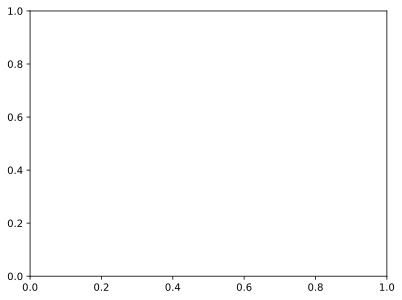

In [2]:
fig, ax = plt.subplots(nrows=1, ncols=1);

### Many Subplots - Horizontal Layout

We can create multiple subplots by using the function `subplot` of *pyplot*  module in *matplotlib*. Here we specify the size of the figure by passing a tuple in the form `(width, height)` to the `figsize` parameter. In addition, the `nrows` and `ncols` specify how many rows and how many columns the figure should have.

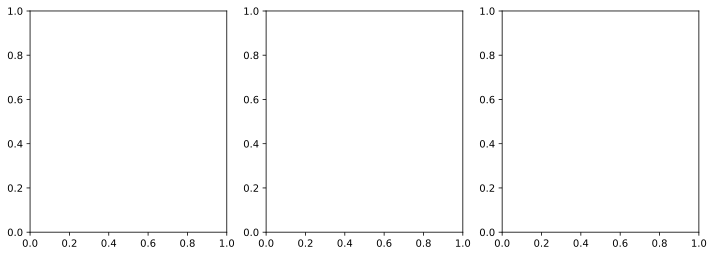

In [3]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4));

###  Multiple Subplots - Grid Layout

Here we can see an example where, instead of specifying the width and height of the figure, we specify the aspect ratio by setting `figsize = plt.figaspect(aspect_ratio)`.

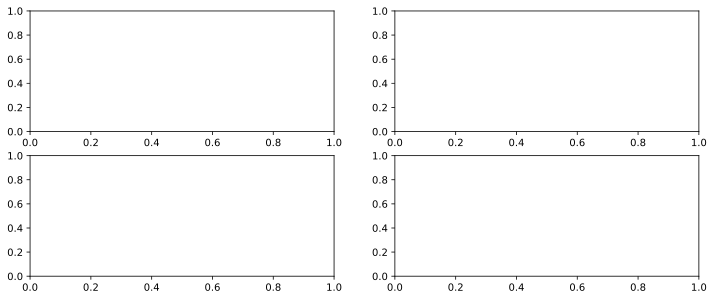

In [4]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=plt.figaspect(0.4));

### Gridspec

Sometimes we may need a grid of plots where some subplots should span multiple rows or columns. The code below shows how to do this using a `gridspec`. Below you will find two examples: a vertical and a horizontal alignment. After creating the `GridSpec` object (line 5), we remove the subplots corresponding to the location of the subplot that will span some rows and some columns. The removal is done by specifying the correct rows and columns in the `for` loop (line 7). Then, we need to add the subplot in the place of the removed subplots. We do this using the function `fig.add_subplot(gs[rows, columns])`, where `gs` is the Gridspace object created at the beginning. Note that `rows` and `columns` passed to the `gs` should correspond to the locations of the axes that we removed in the `for` loop. Finally, we use the `annotate` method to add text to the subplot that spans some rows/columns.

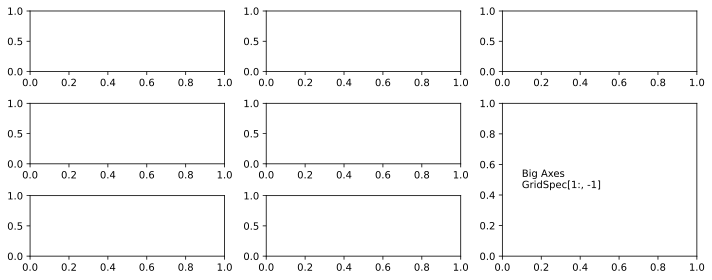

In [5]:
# vertical alignment
fig, axes = plt.subplots(ncols=3, nrows=3, figsize=(10, 4))

# GridSpec object starting at row 1 column 2
gs = axes[1, 2].get_gridspec()

for ax in axes[1:, -1]:
    ax.remove()
big_ax = fig.add_subplot(gs[1:, -1])
big_ax.annotate(
    'Big Axes \nGridSpec[1:, -1]', (0.1, 0.5),
    xycoords='axes fraction', va='center'
)

fig.tight_layout();

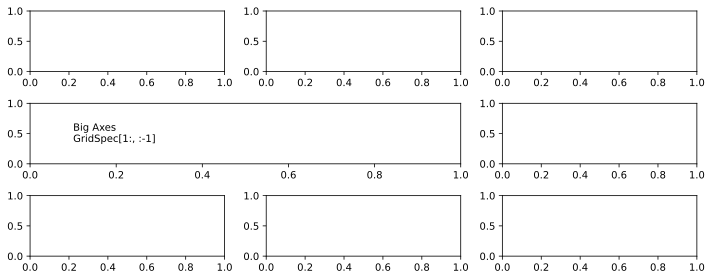

In [6]:
# horizontal alignment
fig, axes = plt.subplots(ncols=3, nrows=3, figsize=(10,4))

# GridSpec object starting at row 1 column 2
gs = axes[1, 2].get_gridspec()

for ax in axes[1, 0:-1]:
    ax.remove()
ax_big = fig.add_subplot(gs[1, :-1])
ax_big.annotate(
    'Big Axes \nGridSpec[1:, :-1]', (0.1, 0.5),
    xycoords='axes fraction', va='center'
)

fig.tight_layout();

:::{note}
 - **axes**: the area where we plot the data; has an x- and y-axis which contain ticks, tick locations, labels and other elements
 - **figure**: the overall window/page where everything is drawn on; can contain multiple axes (subplots) organized in a form of a grid
:::

##  Adding data to specific subplots

When you use _seaborn_, it will automatically create axes and figures for you so you don't need to do any of the above. However, when you want to have better control over your plots you may want to first create your own figure with the desired properties and then place specific plots in its axes. Let's generate some data that we will use in the plots later:

In [7]:
x = np.arange(0.1, 4, 0.1)
df = pd.DataFrame({
    'x': x,
    'y1': np.exp(-1.0 * x),
    'y2': np.exp(-0.5 * x)
})

df.head()

,x,y1,y2
0,0.1,0.904837,0.951229
1,0.2,0.818731,0.904837
2,0.3,0.740818,0.860708
3,0.4,0.670320,0.818731
4,0.5,0.606531,0.778801


### A single plot

As you can see from the code below, we can create a figure and the corresponding axes and then we connect the **seaborn** plot with the figure and axes created via the `ax` parameter inside the plot method of the **seaborn** library.

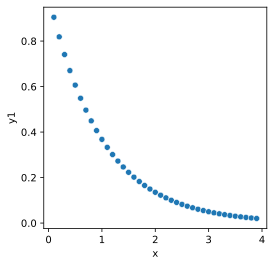

In [8]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(4,4))
sns.scatterplot(data=df, x='x', y='y1', ax=axes);

### Multiple plots

When plotting more than one subplot, `axes` becomes a numpy array with a shape `(nrows, ncols)`. In this case, we need to select which subplot you want to use and pass this one to the plotting function.

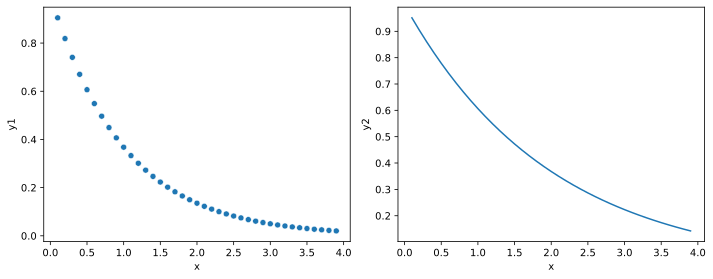

In [9]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

sns.scatterplot(data=df, x='x', y='y1', ax=axes[0])
sns.lineplot(data=df, x='x', y='y2', ax=axes[1])

fig.tight_layout();

Below is an example when axes is a 2D array.

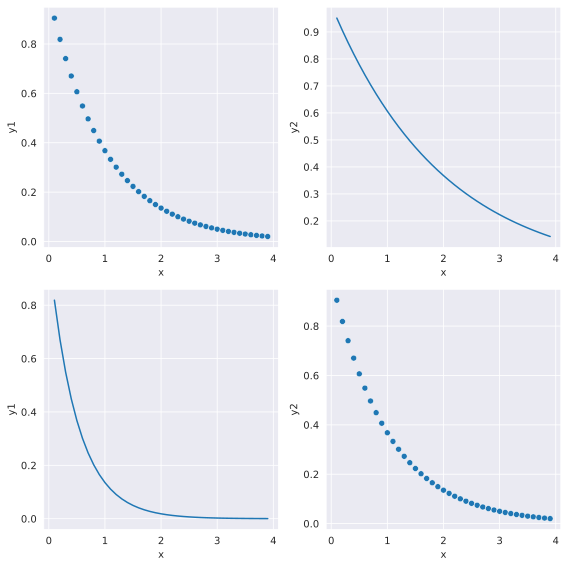

In [10]:
with sns.axes_style("darkgrid"):
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(8, 8))
    sns.scatterplot(data=df, x='x', y='y1', ax=axes[0, 0])
    sns.lineplot(data=df, x='x', y='y2', ax=axes[0, 1])
    sns.lineplot(x=df['x'], y=df['y1']**2, ax=axes[1, 0])
    sns.scatterplot(x=df['x'], y=df['y2']**2, ax=axes[1, 1])

fig.tight_layout();

## Modifying elements of a plot

As you could see so far, we often need to adjust certain elements of a plot. Most of the attributes that we are usually interested in can be modified directly on the *Axes* object (the one that you passed to or received from a *seaborn* plotting function). Adjustments that concern e.g. how subplots relate to one another (like spacing between them) or other ones that have to do with the figure itself (like a figure title) can be set on the *Figure* object directly.

### Axes' labels and title

````{margin}
```{note}
Relevant documentation:
 - [axes labels](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.set_xlabel.html)
 - [axes title](https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.axes.Axes.set_title.html)
```
````

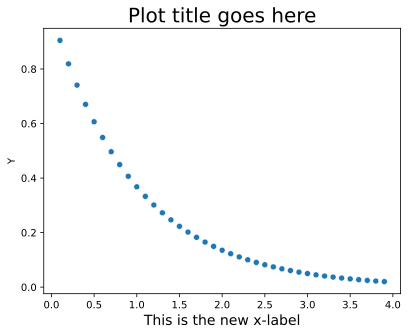

In [11]:
fig, ax = plt.subplots()
sns.scatterplot(data=df, x='x', y='y1', ax=ax)
ax.set_xlabel('This is the new x-label', fontsize=14)
ax.set_ylabel('Y')
ax.set_title('Plot title goes here', fontsize=20);

### Axes' ranges, ticks and tick labels 

````{margin}
```{note}
Relevant documentation:
 - [axes range](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.set_xlim.html)
 - [ticks](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.set_xticks.html)
 - [tick labels](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.set_xticklabels.html)
 - [other tick parameters](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.tick_params.html)
```
````

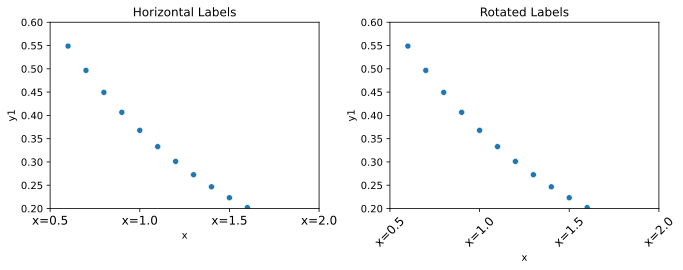

In [12]:
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(10, 4))

# add space between subplots
plt.tight_layout(pad=4.0)

for i, ax in enumerate(axes):
    sns.scatterplot(data=df, x='x', y='y1', ax=axes[i])

    axes[i].set_xlim((0.5, 2.0))
    axes[i].set_ylim((0.2, 0.6))

    xticks = np.arange(0.5, 2.1, 0.5)
    axes[i].set_xticks(xticks)
    axes[i].tick_params(axis='x', which='major', bottom=True)
    axes[i].tick_params(axis='y', which='major', left=True)
    xtick_labels = [f'x={x}' for x in xticks]

    if i == 0:
        axes[i].set_xticklabels(xtick_labels, rotation='horizontal', fontsize=12)
        axes[i].set_title("Horizontal Labels")
    else:
        axes[i].set_xticklabels(xtick_labels, rotation=45, fontsize=12)
        axes[i].set_title("Rotated Labels")

### Axis' scale

````{margin}
```{note}
Relevant documentation:
 - [axis scale](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.set_xscale.html)
```
````

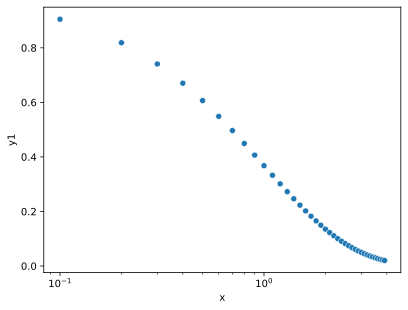

In [13]:
fig, ax = plt.subplots()
sns.scatterplot(data=df, x='x', y='y1', ax=ax)

# set x-axis to logarithmic scale
ax.set_xscale('log');

### Zooming in/out in a plot

````{margin}
```{note}
Relevant documentation:
- [margins](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.margins.html)
```
````

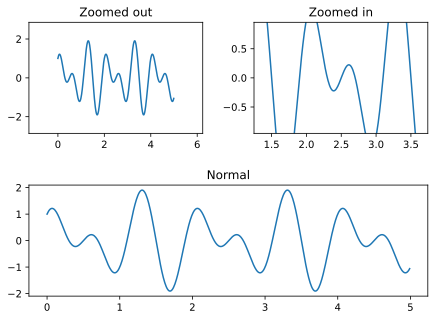

In [14]:
# define the function that will be plotted
def f(x):
    return np.sin(2*np.pi*x) + np.cos(3*np.pi*x)

x = np.arange(0.0, 5.0, 0.01)
axis1 = plt.subplot(212)
axis1.margins() # Default margin is 0.05
axis1.plot(x, f(x))
axis1.set_title('Normal')

axis2 = plt.subplot(221)
# zoom out on both coordinates by a factor of 0.25
axis2.margins(0.25, 0.25)
axis2.plot(x, f(x))
axis2.set_title('Zoomed out')

axis3 = plt.subplot(222)
# zoom in on both coordinates by a factor of 0.25
axis3.margins(-0.25, -0.25)
axis3.plot(x, f(x))
axis3.set_title('Zoomed in')

plt.tight_layout(pad=2.0);

### Color Maps
There are many ways to specify colors when plotting. You can either use [_color palettes_](https://seaborn.pydata.org/tutorial/color_palettes.html) from the seaborn package or [_color maps_](https://matplotlib.org/stable/tutorials/colors/colormaps.html) from the matplotlib library. Below you will find some examples of how to apply both. Please consult respective documentation for more details on both approaches (see links below).

````{margin}
```{note}
Relevant documentation:
- [seaborn's color palettes](https://seaborn.pydata.org/tutorial/color_palettes.html)
- [matplotlib's color maps](https://matplotlib.org/stable/tutorials/colors/colormaps.html)
```
````

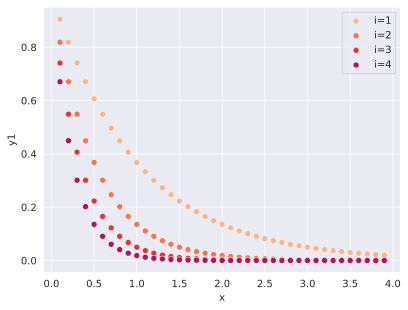

In [15]:
# we can use seaborn's built in color palettes 
# https://seaborn.pydata.org/tutorial/color_palettes.html

with sns.axes_style("darkgrid"):
    fig, ax = plt.subplots()
    
    colors = sns.color_palette("rocket")
    for i in range(1, 5):
        sns.scatterplot(
            x=df['x'], y=df['y1']**i, ax=ax, 
            label=f'i={i}', color=colors[-i]
        )

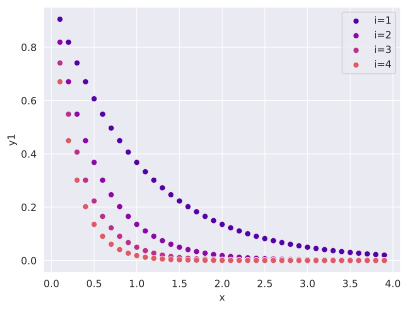

In [16]:
# alternatively, we can use matplotlib's color maps 
# https://matplotlib.org/stable/tutorials/colors/colormaps.html

from matplotlib import cm

with sns.axes_style("darkgrid"):
    fig, ax = plt.subplots()
    
    colors = cm.get_cmap('plasma', 8).colors
    for i in range(1, 5):
        sns.scatterplot(
            x=df['x'], y=df['y1']**i, ax=ax, 
            label=f'i={i}', color=colors[i]
        )

### Legend position and title

````{margin}
```{note}
Relevant documentation:
- [legend](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.legend.html)
```
````

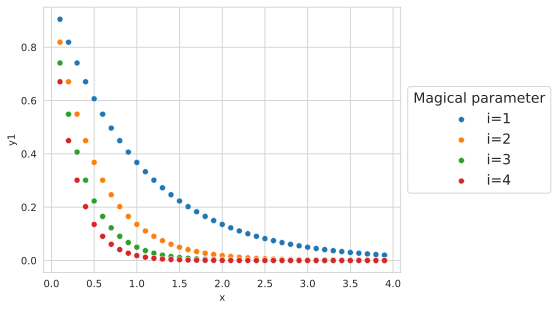

In [17]:
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots()
    
    for i in range(1, 5):
        sns.scatterplot(x=df['x'], y=df['y1']**i, ax=ax, label=f'i={i}')
        
    ax.legend(
        loc='center left', bbox_to_anchor=(1, 0.5), 
        fontsize=14, title_fontsize=14
    )
    legend = ax.get_legend()
    legend.set_title('Magical parameter')

### Figure Title

````{margin}
```{note}
Relevant documentation:
- [figure title](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.suptitle.html)
```
````

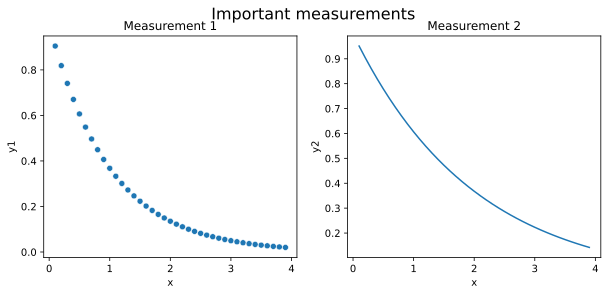

In [18]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

sns.scatterplot(data=df, x='x', y='y1', ax=axes[0])
sns.lineplot(data=df, x='x', y='y2', ax=axes[1])

# we can add title to individual subplots
for i, ax in enumerate(axes):
    axes[i].set_title(f'Measurement {i+1}', fontsize=12)

# but also to the entire figure
fig.suptitle('Important measurements', fontsize=16);

### Layout of Subplots

````{margin}
```{note}
Relevant documentation:
- [tight layout function](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.tight_layout.html)
- [tight layout complete guide](https://matplotlib.org/stable/tutorials/intermediate/tight_layout_guide.html#sphx-glr-tutorials-intermediate-tight-layout-guide-py)
```
````

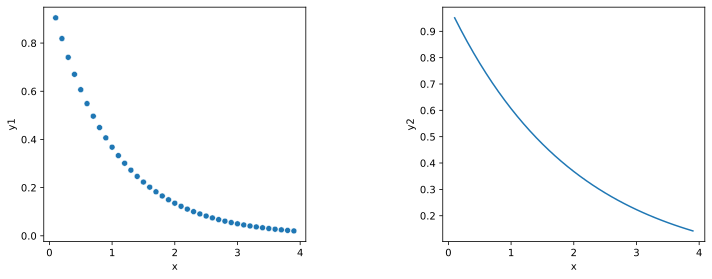

In [19]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

sns.scatterplot(data=df, x='x', y='y1', ax=axes[0])
sns.lineplot(data=df, x='x', y='y2', ax=axes[1])

# we can adjust spacing between individual subplots
fig.tight_layout(w_pad=10);

### Axis label position and colorbars

Here we create a scatterplot out of a dataset with two points (1,1), (2,2). The argument `c` encodes the color of each of the points.

````{margin}
```{note}
Relevant documentation:
 - [axis label position and colorbars](https://matplotlib.org/stable/gallery/subplots_axes_and_figures/axis_labels_demo.html)
```
````

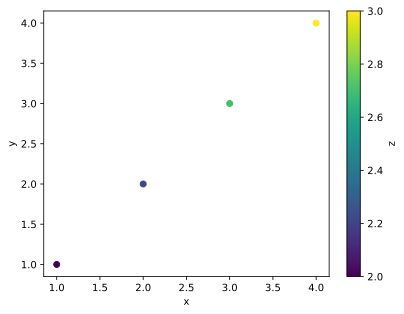

In [20]:
fig, ax = plt.subplots()

sc = ax.scatter([1, 2, 3, 4], [1, 2, 3, 4], c=[2, 2.2, 2.7, 3])
ax.set_ylabel('y')
ax.set_xlabel('x')
cbar = fig.colorbar(sc)
cbar.set_label("z");

## Little Plotting Exercise

Time for a small exercise! It will allow you to practice some of the concepts we introduced in the chapters. We will use one of seaborn's built-in datasets to create a simple visualization and customize it to our liking. The dataset contains diamond prices for approx. 54k diamonds with different properties.

For the sake of this exercise we are only interested in three columns of this dataset: carat, price and cut. Your task is to:
 - create a **square** scatter plot depicting the dependence of the price on the carat value
 - adjust the **axes labels** to be capitalized and with an appropriate font size
 - give the plot an appropriate **title**
 - if not present, add **major ticks** to both axes
 - change the **transparency** of the points to 0.2 (look out for an alpha parameter)
 - change the **color** of the points to your favourite one

**Bonus**: Create one plot where diamonds of 'cut' == 'ideal' are plotted with a different colour then all the other ones. Hint: you can create two dataframes with the two sub-datasets and plot both on the same ax (you can just call the plotting function twice, passing the same ax to both).

In [21]:
diamonds = sns.load_dataset("diamonds")

In [22]:
diamonds.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


To reveal the code solution and see what the plot could look like, unfold the cells below:

In [23]:
ideal = diamonds[diamonds['cut'] == 'Ideal']
other = diamonds[diamonds['cut'] != 'Ideal']

with sns.axes_style("white"):
    fig, ax = plt.subplots(figsize=(10, 10))

    sns.scatterplot(data=other, x='carat', y='price', ax=ax, color='darkgrey', alpha=0.2)
    sns.scatterplot(data=ideal, x='carat', y='price', ax=ax, color='royalblue', alpha=0.2)

    ax.set_xlabel('Carat', fontsize=16)
    ax.set_ylabel('Price [USD]', fontsize=16)

    ax.set_title('Diamond prices', fontsize=18)

    ax.tick_params(axis='both', which='major', bottom=True, left=True, labelsize=12)